# Held-out attribution and Jacobian deformation, Part 2

This notebook is **standalone**. It does not import variables or outputs from Part 1. Model loading,
mean geometry, plotting helpers, and held-out anchor fitting are repeated intentionally.

## Scope

1. Complete held-out age/disease/residual/total attribution.
2. Component net-volume rates, residual contribution, and cancellation.
3. Full forecast volume versus known synthetic thickness and bump progression.
4. Decoder latent Jacobian \(\|J_zF\|\).
5. Directional Jacobian interpretation of
   `INR(mean_z) - INR(mean_z + v*DELTA_T)`.
6. Local surface-area Jacobian.
7. Conclusions and three next-training configurations.

Run from top to bottom. Part 1 is optional.

In [1]:
import json
import math
import random
import re
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import trimesh
from IPython.display import display
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from skimage.measure import marching_cubes

ROOT = Path("/home/jakaria/INR/Deep3DComp")
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from deep_sdf import data as deep_sdf_data
from networks.deep_sdf_decoder import Decoder
from networks.longitudinal_disentangled_flow_64_128_64_adv import (
    build_temporal_flow as build_subset_flow,
)
from networks.longitudinal_additive_flow import (
    build_temporal_flow as build_additive_flow,
)
from train_deep_sdf_longitudinal_disentangled_flow_64_128_64_adv import (
    optimize_subject_anchor_from_observations as optimize_subset_anchor,
)
from train_deep_sdf_longitudinal_additive_flow import (
    optimize_subject_anchor_from_observations as optimize_additive_anchor,
)

SEED = 7
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

GPU_ID = 0
if torch.cuda.is_available():
    torch.cuda.set_device(GPU_ID)
DEVICE = torch.device(f"cuda:{GPU_ID}" if torch.cuda.is_available() else "cpu")

# The grid is only used to extract zero-level-set meshes. Surface derivatives are
# evaluated directly at the resulting vertices.
GRID_RES = 64
GRID_BATCH = 2**17
SURFACE_BATCH = 4096
DELTA_T = 0.10
FD_EPS = 1e-3
EVAL_TIME = 0.50
DIAGNOSIS = 1.0
COMPONENTS = ("age", "disease", "residual", "total")

# Slower: infer anchors from baseline scans of held-out subjects.
RUN_TEST_SUBJECT_VIS = True
TEST_ANCHOR_STEPS = 300
TEST_ANCHOR_SAMPLES = 4096

BASE = ROOT / "examples" / "Torus_subset_100_id_age_progression"
SUBSET_DIR = BASE / "longitudinal_age_disease_conditioned_cocycle_shape_pair_loss_multiple_pairs_disentangled_velocity_64_128_64_binary_margin_adv"
ADDITIVE_DIR = BASE / "longitudinal_age_disease_additive_velocity_disentanglement_strong_residual_invariance_adv"

MODEL_CONFIGS = {
    "subset_best": {
        "label": "Subset 64/128/64 - best",
        "kind": "subset",
        "exp_dir": SUBSET_DIR,
        "checkpoint": "500",
        "reported_test_cd": 0.00014264255878515542,
    },
    "subset_latest": {
        "label": "Subset 64/128/64 - latest",
        "kind": "subset",
        "exp_dir": SUBSET_DIR,
        "checkpoint": "latest",
        "reported_test_cd": 0.00017723951896186918,
    },
    "additive_best": {
        "label": "Additive strong - best",
        "kind": "additive",
        "exp_dir": ADDITIVE_DIR,
        "checkpoint": "1000",
        "reported_test_cd": 0.00021775640198029578,
    },
    "additive_latest": {
        "label": "Additive strong - latest",
        "kind": "additive",
        "exp_dir": ADDITIVE_DIR,
        "checkpoint": "latest",
        "reported_test_cd": 0.0005225880886428058,
    },
}

print("Device:", DEVICE)
print("Grid resolution:", GRID_RES)
print("Finite-step interval DELTA_T:", DELTA_T)
print("Evaluation time:", EVAL_TIME, "| diagnosis:", DIAGNOSIS)

Device: cuda:0
Grid resolution: 64
Finite-step interval DELTA_T: 0.1
Evaluation time: 0.5 | diagnosis: 1.0


## Load best and latest checkpoints

`mean_z` is computed from the training subject anchors saved with the same checkpoint.
It is therefore checkpoint-specific. The held-out subject section later in the notebook independently
fits a baseline anchor and does not use a test subject's future scans.

In [2]:
def checkpoint_path(exp_dir, subdir, checkpoint):
    name = str(checkpoint)
    if not name.endswith(".pth"):
        name += ".pth"
    path = Path(exp_dir) / subdir / name
    if not path.exists():
        raise FileNotFoundError(path)
    return path


def strip_module_prefix(state):
    return {k.removeprefix("module."): v for k, v in state.items()}


def latent_weights(payload):
    lat = payload.get("latent_codes_state_dict", payload.get("latent_codes"))
    if isinstance(lat, dict):
        lat = lat["weight"]
    if lat.ndim == 3 and lat.shape[1] == 1:
        lat = lat[:, 0]
    return lat.detach().float()


def load_model(config):
    exp_dir = Path(config["exp_dir"])
    specs = json.loads((exp_dir / "specs.json").read_text())
    decoder = Decoder(int(specs["CodeLength"]), **specs["NetworkSpecs"]).to(DEVICE)
    builder = build_subset_flow if config["kind"] == "subset" else build_additive_flow
    flow = builder(
        specs,
        int(specs["CodeLength"]),
        list(specs.get("FlowHiddenDims", [256, 256])),
        age_condition_dim=int(specs.get("AgeConditionDim", 0)),
    ).to(DEVICE)

    model_payload = torch.load(
        checkpoint_path(exp_dir, "ModelParameters", config["checkpoint"]),
        map_location=DEVICE,
    )
    decoder.load_state_dict(strip_module_prefix(model_payload["model_state_dict"]))
    flow.load_state_dict(strip_module_prefix(model_payload["flow_state_dict"]))
    decoder.eval()
    flow.eval()

    latent_payload = torch.load(
        checkpoint_path(exp_dir, "LatentCodes", config["checkpoint"]),
        map_location="cpu",
    )
    weights = latent_weights(latent_payload)
    mean_z = weights.mean(dim=0, keepdim=True).to(DEVICE)

    return {
        **config,
        "specs": specs,
        "decoder": decoder,
        "flow": flow,
        "mean_z": mean_z,
        "latent_weights": weights,
        "epoch": int(model_payload.get("epoch", -1)),
    }


MODELS = {name: load_model(config) for name, config in MODEL_CONFIGS.items()}

checkpoint_table = pd.DataFrame(
    [
        {
            "model": model["label"],
            "checkpoint": model["checkpoint"],
            "loaded_epoch": model["epoch"],
            "reported_test_chamfer": model["reported_test_cd"],
            "mean_z_norm": float(model["mean_z"].norm().item()),
        }
        for model in MODELS.values()
    ]
)
display(checkpoint_table)

,model,checkpoint,loaded_epoch,reported_test_chamfer,mean_z_norm
0,Subset 64/128/64 - best,500,500,0.000143,0.027670
1,Subset 64/128/64 - latest,latest,2000,0.000177,0.021397
2,Additive strong - best,1000,1000,0.000218,0.077780
3,Additive strong - latest,latest,2000,0.000523,0.052618


## Geometry and derivative utilities

For the subset model, the three component vectors occupy disjoint latent blocks and are padded back
to 256 dimensions before passing through the INR. For the additive model, each component is already
a full 256-dimensional vector.

The function `surface_component_map` returns:

- `normal_speed`: instantaneous signed outward surface speed,
- `inr_difference`: \(F(x,z)-F(x,z+v\Delta t)\),
- `fd_directional`: central finite-difference estimate of \(\nabla_zF^\top v\),
- `normal_speed_fd`: finite-difference validation of the normal speed,
- outward normals and sparse arrow vectors.

In [3]:
def decode_points(decoder, z, xyz, batch_size=GRID_BATCH):
    z = z.reshape(1, -1)
    outputs = []
    with torch.no_grad():
        for start in range(0, xyz.shape[0], batch_size):
            x = xyz[start:start + batch_size].to(DEVICE)
            zz = z.expand(x.shape[0], -1)
            outputs.append(decoder(torch.cat([zz, x], dim=1)).squeeze(-1).cpu())
    return torch.cat(outputs).numpy()


def regular_grid(resolution=GRID_RES):
    axis = torch.linspace(-1.0, 1.0, int(resolution), dtype=torch.float32)
    grid = torch.stack(
        torch.meshgrid(axis, axis, axis, indexing="ij"),
        dim=-1,
    ).reshape(-1, 3)
    return axis.numpy(), grid


def decode_grid(decoder, z, resolution=GRID_RES):
    axis, xyz = regular_grid(resolution)
    values = decode_points(decoder, z, xyz).reshape(resolution, resolution, resolution)
    return axis, values


def mesh_from_grid(sdf_grid):
    spacing = 2.0 / (sdf_grid.shape[0] - 1)
    vertices, faces, _, _ = marching_cubes(
        sdf_grid,
        level=0.0,
        spacing=(spacing, spacing, spacing),
    )
    vertices = vertices - 1.0

    # Do not pass skimage's gradient-direction normals to Trimesh. Their
    # orientation can oppose the triangle winding for an outside-positive SDF.
    # Face winding is made outward using signed enclosed volume, after which
    # Trimesh derives consistent outward vertex normals from the faces.
    mesh = trimesh.Trimesh(vertices=vertices, faces=faces, process=False)
    if mesh.is_watertight and mesh.volume < 0.0:
        mesh.invert()
    return mesh


def component_vectors(model, z, time_value=EVAL_TIME, diagnosis=DIAGNOSIS):
    flow = model["flow"]
    t = torch.full((z.shape[0], 1), float(time_value), device=z.device, dtype=z.dtype)
    cond = torch.full((z.shape[0], 1), float(diagnosis), device=z.device, dtype=z.dtype)
    with torch.no_grad():
        comp = flow.velocity_components(z, t, t, age_cond=cond)

    if model["kind"] == "subset":
        batch = z.shape[0]
        age = torch.cat(
            [
                comp["age"],
                torch.zeros(batch, flow.disease_dim + flow.residual_dim, device=z.device, dtype=z.dtype),
            ],
            dim=1,
        )
        disease = torch.cat(
            [
                torch.zeros(batch, flow.age_dim, device=z.device, dtype=z.dtype),
                comp["disease"],
                torch.zeros(batch, flow.residual_dim, device=z.device, dtype=z.dtype),
            ],
            dim=1,
        )
        residual = torch.cat(
            [
                torch.zeros(batch, flow.age_dim + flow.disease_dim, device=z.device, dtype=z.dtype),
                comp["residual"],
            ],
            dim=1,
        )
    else:
        age = comp["age"]
        disease = comp["disease"]
        residual = comp["residual"]

    return {
        "age": age,
        "disease": disease,
        "residual": residual,
        "total": age + disease + residual,
    }


def surface_geometry(decoder, z, resolution=GRID_RES):
    axis, grid = decode_grid(decoder, z, resolution)
    mesh = mesh_from_grid(grid)
    vertices = torch.as_tensor(mesh.vertices, dtype=z.dtype, device=DEVICE)

    sdf_parts = []
    grad_parts = []
    for start in range(0, vertices.shape[0], SURFACE_BATCH):
        x = vertices[start:start + SURFACE_BATCH].detach().clone().requires_grad_(True)
        zz = z.detach().expand(x.shape[0], -1)
        sdf = decoder(torch.cat([zz, x], dim=1)).squeeze(-1)
        grad_x = torch.autograd.grad(sdf.sum(), x, create_graph=False)[0]
        sdf_parts.append(sdf.detach().cpu())
        grad_parts.append(grad_x.detach().cpu())

    sdf = torch.cat(sdf_parts).numpy()
    grad_x = torch.cat(grad_parts).numpy()
    grad_norm = np.linalg.norm(grad_x, axis=1) + 1e-12
    grad_unit = grad_x / grad_norm[:, None]
    mesh_normals = np.asarray(mesh.vertex_normals)
    alignment = np.einsum("ij,ij->i", grad_unit, mesh_normals)
    sdf_to_outward_sign = 1.0 if np.nanmedian(alignment) >= 0.0 else -1.0
    outward_normals = sdf_to_outward_sign * grad_unit

    return {
        "axis": axis,
        "sdf_grid": grid,
        "mesh": mesh,
        "vertices": vertices,
        "base_sdf": sdf,
        "grad_x": grad_x,
        "grad_norm": grad_norm,
        "outward_normals": outward_normals,
        "sdf_to_outward_sign": sdf_to_outward_sign,
        "median_normal_alignment": float(np.nanmedian(np.abs(alignment))),
        "signed_mesh_volume": float(mesh.volume),
        "mesh_is_watertight": bool(mesh.is_watertight),
    }


def latent_jvp_at_vertices(decoder, z, velocity, vertices):
    parts = []
    for start in range(0, vertices.shape[0], SURFACE_BATCH):
        x = vertices[start:start + SURFACE_BATCH].detach()
        z0 = z.detach().clone().requires_grad_(True)
        v0 = velocity.detach()

        def decode_for_latent(latent):
            zz = latent.expand(x.shape[0], -1)
            return decoder(torch.cat([zz, x], dim=1)).squeeze(-1)

        _, jvp = torch.autograd.functional.jvp(
            decode_for_latent,
            z0,
            v0,
            create_graph=False,
            strict=False,
        )
        parts.append(jvp.detach().cpu())
    return torch.cat(parts).numpy()


def vertex_area_weights(mesh):
    weights = np.zeros(len(mesh.vertices), dtype=np.float64)
    contribution = np.asarray(mesh.area_faces, dtype=np.float64) / 3.0
    for corner in range(3):
        np.add.at(weights, np.asarray(mesh.faces)[:, corner], contribution)
    return weights


def surface_component_map(model, geometry, z, velocity, delta_t=DELTA_T, fd_eps=FD_EPS):
    vertices = geometry["vertices"]
    decoder = model["decoder"]
    jvp = latent_jvp_at_vertices(decoder, z, velocity, vertices)

    xyz_cpu = vertices.detach().cpu()
    sdf_step = decode_points(decoder, z + delta_t * velocity, xyz_cpu)
    sdf_plus = decode_points(decoder, z + fd_eps * velocity, xyz_cpu)
    sdf_minus = decode_points(decoder, z - fd_eps * velocity, xyz_cpu)
    fd_directional = (sdf_plus - sdf_minus) / (2.0 * fd_eps)

    sign = geometry["sdf_to_outward_sign"]
    grad_norm = geometry["grad_norm"]
    normal_speed = -sign * jvp / grad_norm
    normal_speed_fd = -sign * fd_directional / grad_norm
    inr_difference = geometry["base_sdf"] - sdf_step
    arrows = normal_speed[:, None] * geometry["outward_normals"]

    weights = vertex_area_weights(geometry["mesh"])
    total_area = weights.sum()
    jvp_error = np.sqrt(np.average((jvp - fd_directional) ** 2, weights=weights))
    jvp_scale = np.sqrt(np.average(fd_directional ** 2, weights=weights)) + 1e-12
    metrics = {
        "latent_velocity_norm": float(velocity.norm().item()),
        "mean_abs_normal_speed": float(np.average(np.abs(normal_speed), weights=weights)),
        "rms_normal_speed": float(np.sqrt(np.average(normal_speed ** 2, weights=weights))),
        "net_volume_rate": float(np.sum(normal_speed * weights)),
        "expanding_area_fraction": float(np.sum(weights[normal_speed > 0]) / total_area),
        "contracting_area_fraction": float(np.sum(weights[normal_speed < 0]) / total_area),
        "jvp_fd_relative_rmse": float(jvp_error / jvp_scale),
    }
    return {
        "velocity": velocity.detach(),
        "jvp": jvp,
        "fd_directional": fd_directional,
        "normal_speed": normal_speed,
        "normal_speed_fd": normal_speed_fd,
        "inr_difference": inr_difference,
        "sdf_step": sdf_step,
        "arrows": arrows,
        "metrics": metrics,
    }


def weighted_correlation(a, b, weights):
    w = weights / weights.sum()
    am = np.sum(w * a)
    bm = np.sum(w * b)
    ac = a - am
    bc = b - bm
    denom = math.sqrt(np.sum(w * ac**2) * np.sum(w * bc**2)) + 1e-12
    return float(np.sum(w * ac * bc) / denom)

## Backend preparation

The mean-anchor maps are computed because the Jacobian sections require the same surface geometry and
component velocities. The large mean-anchor visualization grid is in Part 1 and is not repeated here.

In [4]:
GEOMETRY = {}
RESULTS = {}
metric_rows = []

for model_name, model in MODELS.items():
    print("Geometry:", model["label"])
    z = model["mean_z"]
    geometry = surface_geometry(model["decoder"], z)
    velocities = component_vectors(model, z)
    GEOMETRY[model_name] = geometry
    RESULTS[model_name] = {}

    for component in COMPONENTS:
        print("  component:", component)
        result = surface_component_map(
            model,
            geometry,
            z,
            velocities[component],
        )
        RESULTS[model_name][component] = result
        metric_rows.append(
            {
                "model_key": model_name,
                "model": model["label"],
                "epoch": model["epoch"],
                "component": component,
                "median_abs_sdf_normal_alignment": geometry["median_normal_alignment"],
                **result["metrics"],
            }
        )

METRICS = pd.DataFrame(metric_rows)

for model_name, model in MODELS.items():
    weights = vertex_area_weights(GEOMETRY[model_name]["mesh"])
    corr = weighted_correlation(
        RESULTS[model_name]["age"]["normal_speed"],
        RESULTS[model_name]["disease"]["normal_speed"],
        weights,
    )
    METRICS.loc[METRICS["model_key"] == model_name, "age_disease_shape_corr"] = corr

print("Prepared mean-anchor geometry and component maps for Jacobian analysis.")

Geometry: Subset 64/128/64 - best
  component: age
  component: disease
  component: residual
  component: total
Geometry: Subset 64/128/64 - latest
  component: age
  component: disease
  component: residual
  component: total
Geometry: Additive strong - best
  component: age
  component: disease
  component: residual
  component: total
Geometry: Additive strong - latest
  component: age
  component: disease
  component: residual
  component: total
Prepared mean-anchor geometry and component maps for Jacobian analysis.


In [5]:
def robust_symmetric_limit(arrays, quantile=0.98):
    values = np.concatenate([np.ravel(np.asarray(a)) for a in arrays])
    limit = float(np.quantile(np.abs(values[np.isfinite(values)]), quantile))
    return max(limit, 1e-12)


def mesh_surface_trace(mesh, values, cmin, cmax, colorscale="RdBu_r", show_colorbar=False, title=""):
    vertices = np.asarray(mesh.vertices)
    faces = np.asarray(mesh.faces)
    return go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        intensity=np.asarray(values),
        intensitymode="vertex",
        colorscale=colorscale,
        cmin=cmin,
        cmax=cmax,
        showscale=show_colorbar,
        colorbar=dict(title=title, thickness=18, len=0.72),
        lighting=dict(ambient=0.45, diffuse=0.75, specular=0.25, roughness=0.65),
        lightposition=dict(x=100, y=150, z=200),
        flatshading=False,
        hovertemplate="value=%{intensity:.5g}<extra></extra>",
    )


def comparison_surface_figure(value_key, figure_title, colorbar_title, colorscale="RdBu_r"):
    model_names = list(MODELS)
    arrays = [
        RESULTS[name][component][value_key]
        for name in model_names
        for component in COMPONENTS
    ]
    limit = robust_symmetric_limit(arrays)
    fig = make_subplots(
        rows=len(model_names),
        cols=len(COMPONENTS),
        specs=[[{"type": "scene"}] * len(COMPONENTS) for _ in model_names],
        row_titles=[MODELS[name]["label"] for name in model_names],
        column_titles=[c.title() for c in COMPONENTS],
        horizontal_spacing=0.01,
        vertical_spacing=0.015,
    )

    for row, name in enumerate(model_names, start=1):
        mesh = GEOMETRY[name]["mesh"]
        for col, component in enumerate(COMPONENTS, start=1):
            show_scale = row == 1 and col == len(COMPONENTS)
            fig.add_trace(
                mesh_surface_trace(
                    mesh,
                    RESULTS[name][component][value_key],
                    -limit,
                    limit,
                    colorscale=colorscale,
                    show_colorbar=show_scale,
                    title=colorbar_title,
                ),
                row=row,
                col=col,
            )

    for scene_name in [k for k in fig.layout if str(k).startswith("scene")]:
        fig.layout[scene_name].update(
            aspectmode="data",
            xaxis_visible=False,
            yaxis_visible=False,
            zaxis_visible=False,
            camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
        )
    fig.update_layout(
        title=dict(text=f"{figure_title}<br><sup>pooled 98th-percentile limits: +/-{limit:.4g}</sup>", x=0.5),
        height=310 * len(model_names),
        width=1320,
        margin=dict(l=100, r=30, t=100, b=20),
    )
    return fig


## Held-out test subjects

Only the baseline scan is used to fit each subject anchor. Future scans are not used in anchor
optimization. The initial figures show age and disease maps; expanded figures below add residual and
total maps because omitted residual motion can hide component cancellation.

The selected cases are:

- SID 27: healthy, so the disease component should be exactly zero.
- SID 4: diseased, with known global thinning and a growing localized bump.

These are qualitative examples. Publication claims should aggregate every held-out subject.

In [6]:
TORUS_RE = re.compile(r"^(?:ID|id)_(\d+)_t(\d+)$")


def load_labels(labels_path):
    obj = torch.load(labels_path, map_location="cpu")
    rows = []
    for scan, payload in obj.items():
        row = {"scan_id": str(scan)}
        row.update(payload)
        rows.append(row)
    return pd.DataFrame(rows)


def parse_scan(scan):
    match = TORUS_RE.match(Path(str(scan)).stem)
    if match is None:
        raise ValueError(scan)
    return int(match.group(1)), int(match.group(2))


def test_records(specs):
    labels = load_labels(specs["AgeMetadataFile"])
    label_map = labels.set_index("scan_id").to_dict("index")
    split = json.loads(Path(specs["TestSplit"]).read_text())
    records = []
    for scan in split:
        stem = Path(str(scan)).stem
        sid, tp = parse_scan(stem)
        meta = label_map[stem]
        records.append(
            {
                "scan_id": stem,
                "sid": sid,
                "tp": tp,
                "time": float(meta["age_norm"]),
                "age": float(meta["age"]),
                "diagnosis": int(meta["diagnosis"]),
                "sdf_path": Path(specs["DataSource"]) / f"{stem}.npz",
            }
        )
    by_subject = {}
    for record in records:
        by_subject.setdefault(record["sid"], []).append(record)
    return {sid: sorted(items, key=lambda x: x["time"]) for sid, items in by_subject.items()}


def choose_test_subjects(records_by_subject):
    healthy = next(
        sid for sid, recs in records_by_subject.items()
        if int(recs[0]["diagnosis"]) == 0
    )
    diseased = next(
        sid for sid, recs in records_by_subject.items()
        if int(recs[0]["diagnosis"]) == 1
    )
    return healthy, diseased


def infer_test_anchor(model, baseline_record):
    samples = deep_sdf_data.read_sdf_samples_into_ram(str(baseline_record["sdf_path"]))
    observation = {
        "samples": samples,
        "time": float(baseline_record["time"]),
        "age_cond": torch.tensor([float(baseline_record["diagnosis"])], dtype=torch.float32),
    }
    optimizer_fn = optimize_subset_anchor if model["kind"] == "subset" else optimize_additive_anchor
    anchor, history = optimizer_fn(
        decoder=model["decoder"],
        temporal_flow=model["flow"],
        latent_size=int(model["specs"]["CodeLength"]),
        observations=[observation],
        clamp_dist=float(model["specs"].get("ClampingDistance", 0.1)),
        num_iterations=TEST_ANCHOR_STEPS,
        num_samples=TEST_ANCHOR_SAMPLES,
        lr=5e-3,
        init_std=0.01,
        code_reg_lambda=float(model["specs"].get("CodeRegularizationLambda", 1e-4)),
        code_bound=model["specs"].get("CodeBound", None),
        use_pair_forward_consistency=False,
        use_pair_backward_consistency=False,
        use_general_cocycle_consistency=False,
        use_age_conditioning=True,
    )
    return anchor.detach(), history


def compute_anchor_maps(model, anchor, time_value, diagnosis):
    geometry = surface_geometry(model["decoder"], anchor)
    velocities = component_vectors(model, anchor, time_value=time_value, diagnosis=diagnosis)
    maps = {
        component: surface_component_map(model, geometry, anchor, velocities[component])
        for component in COMPONENTS
    }
    return geometry, maps


if RUN_TEST_SUBJECT_VIS:
    records = test_records(MODELS["subset_best"]["specs"])
    healthy_sid, diseased_sid = choose_test_subjects(records)
    print("Selected healthy SID:", healthy_sid, "| diseased SID:", diseased_sid)

    TEST_RESULTS = {}
    for sid in (healthy_sid, diseased_sid):
        baseline = records[sid][0]
        TEST_RESULTS[sid] = {}
        for model_name, model in MODELS.items():
            print("Fitting", model["label"], "SID", sid)
            anchor, history = infer_test_anchor(model, baseline)
            geometry, maps = compute_anchor_maps(
                model,
                anchor,
                time_value=baseline["time"],
                diagnosis=baseline["diagnosis"],
            )
            TEST_RESULTS[sid][model_name] = {
                "baseline": baseline,
                "anchor": anchor,
                "loss_history": history,
                "geometry": geometry,
                "maps": maps,
            }

    def test_subject_surface_figure(sid, value_key="normal_speed"):
        component_names = ("age", "disease")
        arrays = [
            TEST_RESULTS[sid][name]["maps"][component][value_key]
            for name in MODELS
            for component in component_names
        ]
        limit = robust_symmetric_limit(arrays)
        baseline = TEST_RESULTS[sid]["subset_best"]["baseline"]
        fig = make_subplots(
            rows=len(MODELS),
            cols=len(component_names),
            specs=[[{"type": "scene"}] * len(component_names) for _ in MODELS],
            row_titles=[MODELS[name]["label"] for name in MODELS],
            column_titles=["Age", "Disease"],
            horizontal_spacing=0.015,
            vertical_spacing=0.02,
        )
        for row, name in enumerate(MODELS, start=1):
            geometry = TEST_RESULTS[sid][name]["geometry"]
            maps = TEST_RESULTS[sid][name]["maps"]
            for col, component in enumerate(component_names, start=1):
                fig.add_trace(
                    mesh_surface_trace(
                        geometry["mesh"],
                        maps[component][value_key],
                        -limit,
                        limit,
                        show_colorbar=(row == 1 and col == len(component_names)),
                        title=value_key.replace("_", " "),
                    ),
                    row=row,
                    col=col,
                )
        for scene_name in [k for k in fig.layout if str(k).startswith("scene")]:
            fig.layout[scene_name].update(
                aspectmode="data",
                xaxis_visible=False,
                yaxis_visible=False,
                zaxis_visible=False,
                camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
            )
        status = "diseased" if baseline["diagnosis"] else "healthy"
        fig.update_layout(
            title=(
                f"Held-out SID {sid} ({status}), baseline age {baseline['age']:.2f}"
                f"<br><sup>{value_key}; pooled limit +/-{limit:.4g}</sup>"
            ),
            width=900,
            height=300 * len(MODELS),
            margin=dict(l=120, r=30, t=90, b=20),
        )
        return fig

    print("Held-out anchors and component maps are ready.")
else:
    print("Skipped. Set RUN_TEST_SUBJECT_VIS=True to infer held-out baseline anchors.")

Selected healthy SID: 27 | diseased SID: 4
Fitting Subset 64/128/64 - best SID 27
Fitting Subset 64/128/64 - latest SID 27
Fitting Additive strong - best SID 27
Fitting Additive strong - latest SID 27


Fitting Subset 64/128/64 - best SID 4
Fitting Subset 64/128/64 - latest SID 4
Fitting Additive strong - best SID 4
Fitting Additive strong - latest SID 4
Held-out anchors and component maps are ready.


## Full held-out decomposition: age, disease, residual, total

The earlier held-out plot omitted residual and total motion. That can make age/disease maps look like
the complete explanation even when a residual field counteracts them.

For each subject:

- rows compare best/latest checkpoints and architectures,
- columns show age, disease, residual, and their sum,
- one pooled color range is used,
- `net_volume_rate` is the signed first-order volume contribution,
- `cancellation_index` is near zero when components reinforce one another and increases when positive
  and negative contributions cancel.

,sid,diagnosis,model_key,model,net_age,net_disease,net_residual,net_total,rms_age,rms_disease,rms_residual,rms_total,cancellation_index,residual_rms_fraction
0,27,0,subset_best,Subset 64/128/64 - best,-0.021264,0.000000,-0.231477,-0.252741,0.010181,0.000000,0.068736,0.075258,4.773142e-09,0.870996
1,27,0,subset_latest,Subset 64/128/64 - latest,-0.032085,0.000000,-0.235332,-0.267417,0.013129,0.000000,0.071686,0.081621,-7.290816e-09,0.845201
2,27,0,additive_best,Additive strong - best,-0.203453,0.000000,-0.010599,-0.214052,0.060453,0.000000,0.005604,0.063681,-3.092413e-08,0.084834
3,27,0,additive_latest,Additive strong - latest,-0.206086,0.000000,-0.019695,-0.225781,0.060060,0.000000,0.006347,0.065751,6.627161e-08,0.095574
4,4,1,subset_best,Subset 64/128/64 - best,-0.032830,-0.178164,-0.163931,-0.374925,0.016473,0.075676,0.062755,0.149718,2.842242e-08,0.405121
5,4,1,subset_latest,Subset 64/128/64 - latest,-0.033442,-0.216345,-0.178909,-0.428695,0.013891,0.088838,0.067653,0.166723,-3.625943e-09,0.397066
6,4,1,additive_best,Additive strong - best,-0.167973,-0.305683,-0.014558,-0.488214,0.059429,0.107660,0.008613,0.170172,-7.250274e-08,0.049018
7,4,1,additive_latest,Additive strong - latest,-0.238425,-0.233186,-0.042672,-0.514283,0.077967,0.082349,0.014154,0.170959,7.041391e-08,0.081124


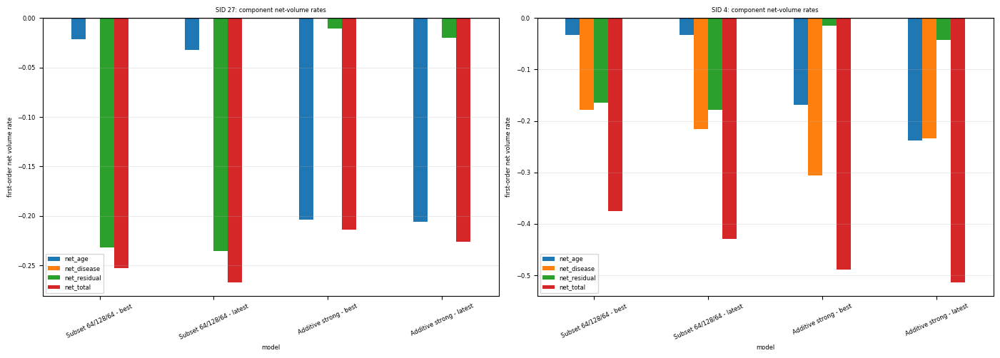

In [11]:
def heldout_full_component_figure(sid):
    arrays = [
        TEST_RESULTS[sid][name]["maps"][component]["normal_speed"]
        for name in MODELS
        for component in COMPONENTS
    ]
    limit = robust_symmetric_limit(arrays)
    fig = make_subplots(
        rows=len(MODELS),
        cols=len(COMPONENTS),
        specs=[[{"type": "scene"}] * len(COMPONENTS) for _ in MODELS],
        row_titles=[MODELS[name]["label"] for name in MODELS],
        column_titles=[c.title() for c in COMPONENTS],
        horizontal_spacing=0.01,
        vertical_spacing=0.018,
    )
    for row, name in enumerate(MODELS, start=1):
        result = TEST_RESULTS[sid][name]
        for col, component in enumerate(COMPONENTS, start=1):
            fig.add_trace(
                mesh_surface_trace(
                    result["geometry"]["mesh"],
                    result["maps"][component]["normal_speed"],
                    -limit,
                    limit,
                    show_colorbar=(row == 1 and col == len(COMPONENTS)),
                    title="normal speed",
                ),
                row=row,
                col=col,
            )
    for scene_name in [k for k in fig.layout if str(k).startswith("scene")]:
        fig.layout[scene_name].update(
            aspectmode="data",
            xaxis_visible=False,
            yaxis_visible=False,
            zaxis_visible=False,
            camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
        )
    baseline = TEST_RESULTS[sid]["subset_best"]["baseline"]
    status = "diseased" if baseline["diagnosis"] else "healthy"
    fig.update_layout(
        title=(
            f"Full held-out decomposition | SID {sid} ({status})"
            f"<br><sup>pooled 98th-percentile limit +/-{limit:.4g}</sup>"
        ),
        width=1320,
        height=305 * len(MODELS),
        margin=dict(l=120, r=30, t=95, b=20),
    )
    return fig


heldout_full_component_figure(healthy_sid).show()
heldout_full_component_figure(diseased_sid).show()

heldout_rows = []
for sid in (healthy_sid, diseased_sid):
    for model_name, model in MODELS.items():
        maps = TEST_RESULTS[sid][model_name]["maps"]
        net = {c: maps[c]["metrics"]["net_volume_rate"] for c in COMPONENTS}
        rms = {c: maps[c]["metrics"]["rms_normal_speed"] for c in COMPONENTS}
        denominator = sum(abs(net[c]) for c in ("age", "disease", "residual")) + 1e-12
        cancellation = 1.0 - abs(net["total"]) / denominator
        heldout_rows.append(
            {
                "sid": sid,
                "diagnosis": TEST_RESULTS[sid][model_name]["baseline"]["diagnosis"],
                "model_key": model_name,
                "model": model["label"],
                **{f"net_{c}": net[c] for c in COMPONENTS},
                **{f"rms_{c}": rms[c] for c in COMPONENTS},
                "cancellation_index": cancellation,
                "residual_rms_fraction": rms["residual"]
                / (rms["age"] + rms["disease"] + rms["residual"] + 1e-12),
            }
        )
HELDOUT_COMPONENTS = pd.DataFrame(heldout_rows)
display(HELDOUT_COMPONENTS)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, sid in zip(axes, (healthy_sid, diseased_sid)):
    sub = HELDOUT_COMPONENTS[HELDOUT_COMPONENTS["sid"] == sid].set_index("model")
    sub[["net_age", "net_disease", "net_residual", "net_total"]].plot.bar(ax=ax)
    ax.axhline(0.0, color="black", linewidth=1)
    ax.set_title(f"SID {sid}: component net-volume rates")
    ax.set_ylabel("first-order net volume rate")
    ax.grid(axis="y", alpha=0.25)
    ax.tick_params(axis="x", rotation=25)
plt.tight_layout()
plt.show()

## Ground truth and total forecast progression

The synthetic data has known mechanisms:

- healthy and diseased subjects both undergo global thinning,
- diseased subjects thin faster,
- only diseased subjects have a growing localized bump.

The following plots compare these known variables with volumes decoded from the **full** model
trajectory. This separates forecasting accuracy from component interpretation. A model may forecast
the final shape reasonably while its age/disease/residual labels are wrong because components cancel.

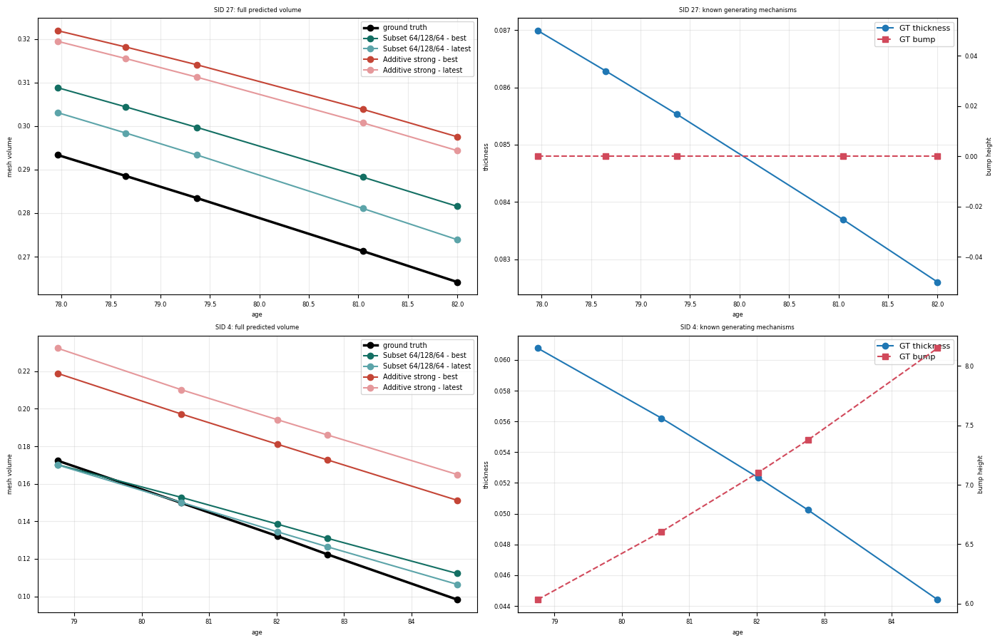

,sid,diagnosis,scan_id,age,time,gt_thickness,gt_bump_height,gt_volume,volume_subset_best,volume_subset_latest,volume_additive_best,volume_additive_latest
0,27,0,ID_027_t0,77.962471,0.699062,0.086990,0.000000,0.293371,0.308837,0.303103,0.321942,0.319494
1,27,0,ID_027_t1,78.649971,0.716249,0.086285,0.000000,0.288551,0.304427,0.298421,0.318187,0.315535
2,27,0,ID_027_t2,79.368477,0.734212,0.085529,0.000000,0.283474,0.299714,0.293371,0.314105,0.311265
3,27,0,ID_027_t3,81.046677,0.776167,0.083692,0.000000,0.271267,0.288269,0.281066,0.303850,0.300741
4,27,0,ID_027_t4,81.998978,0.799974,0.082604,0.000000,0.264172,0.281562,0.273910,0.297556,0.294373
5,4,1,ID_004_t0,78.753929,0.718848,0.060759,6.034772,0.172340,0.170210,0.170074,0.218880,0.232279
6,4,1,ID_004_t1,80.586525,0.764663,0.056216,6.605385,0.149861,0.152782,0.150121,0.197232,0.210172
7,4,1,ID_004_t2,82.017929,0.800448,0.052356,7.101387,0.132067,0.138466,0.134364,0.181056,0.194120
8,4,1,ID_004_t3,82.758339,0.818958,0.050249,7.376023,0.122344,0.130919,0.126387,0.172713,0.186002
9,4,1,ID_004_t4,84.678932,0.866973,0.044420,8.148327,0.098284,0.112195,0.106397,0.151212,0.164966


In [8]:
LABEL_OBJECT = torch.load(
    MODELS["subset_best"]["specs"]["AgeMetadataFile"], map_location="cpu"
)


def gt_record(scan_id):
    return LABEL_OBJECT[str(scan_id)]


def forecast_volume_table():
    rows = []
    for sid in (healthy_sid, diseased_sid):
        subject_records = records[sid]
        baseline_t = float(subject_records[0]["time"])
        for record in subject_records:
            gt = gt_record(record["scan_id"])
            base_row = {
                "sid": sid,
                "diagnosis": int(record["diagnosis"]),
                "scan_id": record["scan_id"],
                "age": float(record["age"]),
                "time": float(record["time"]),
                "gt_thickness": float(gt["thickness_t"]),
                "gt_bump_height": float(gt["bump_height"]),
            }
            gt_mesh_path = (
                Path(MODELS["subset_best"]["specs"]["DataSourceMesh"])
                / f"{record['scan_id']}.obj"
            )
            base_row["gt_volume"] = abs(trimesh.load(gt_mesh_path, force="mesh", process=False).volume)
            for model_name, model in MODELS.items():
                anchor = TEST_RESULTS[sid][model_name]["anchor"]
                s = torch.tensor([[baseline_t]], device=anchor.device, dtype=anchor.dtype)
                t = torch.tensor([[record["time"]]], device=anchor.device, dtype=anchor.dtype)
                cond = torch.tensor(
                    [[float(record["diagnosis"])]], device=anchor.device, dtype=anchor.dtype
                )
                with torch.no_grad():
                    z_t = anchor + (t - s) * model["flow"](anchor, s, t, age_cond=cond)
                _, grid = decode_grid(model["decoder"], z_t, GRID_RES)
                predicted_mesh = mesh_from_grid(grid)
                base_row[f"volume_{model_name}"] = abs(predicted_mesh.volume)
            rows.append(base_row)
    return pd.DataFrame(rows)


FORECAST_VOLUME = forecast_volume_table()

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
model_colors = {
    "subset_best": "#136F63",
    "subset_latest": "#5CA4A9",
    "additive_best": "#C44536",
    "additive_latest": "#E5989B",
}
for row, sid in enumerate((healthy_sid, diseased_sid)):
    sub = FORECAST_VOLUME[FORECAST_VOLUME["sid"] == sid]
    axes[row, 0].plot(sub["age"], sub["gt_volume"], "ko-", linewidth=2.5, label="ground truth")
    for model_name, color in model_colors.items():
        axes[row, 0].plot(
            sub["age"],
            sub[f"volume_{model_name}"],
            marker="o",
            color=color,
            label=MODELS[model_name]["label"],
        )
    axes[row, 0].set_title(f"SID {sid}: full predicted volume")
    axes[row, 0].set_xlabel("age")
    axes[row, 0].set_ylabel("mesh volume")
    axes[row, 0].grid(alpha=0.25)
    axes[row, 0].legend(fontsize=7)

    axes[row, 1].plot(sub["age"], sub["gt_thickness"], "o-", label="GT thickness")
    ax2 = axes[row, 1].twinx()
    ax2.plot(sub["age"], sub["gt_bump_height"], "s--", color="#D1495B", label="GT bump")
    axes[row, 1].set_title(f"SID {sid}: known generating mechanisms")
    axes[row, 1].set_xlabel("age")
    axes[row, 1].set_ylabel("thickness")
    ax2.set_ylabel("bump height")
    axes[row, 1].grid(alpha=0.25)
    lines = axes[row, 1].lines + ax2.lines
    axes[row, 1].legend(lines, [line.get_label() for line in lines], fontsize=8)
plt.tight_layout()
plt.show()
display(FORECAST_VOLUME)

## Jacobian deformation analysis

The referenced paper, *Capturing Longitudinal Changes in Brain Morphology Using Temporally
Parameterized Neural Displacement Fields* ([arXiv:2504.09514](https://arxiv.org/pdf/2504.09514)),
learns a correspondence map:

\[
\phi_t(x)=x+u(x,t)
\]

and visualizes the volumetric Jacobian determinant

\[
|J_\phi|=\det\left(\frac{\partial\phi_t}{\partial x}\right).
\]

There, `|J| > 1` means local volume expansion, `0 < |J| < 1` contraction, and the temporal
derivative \(\partial |J|/\partial t\) is regularized for monotonicity.

Our DeepSDF decoder predicts occupancy geometry \(F(x,z)\), not point correspondence. Therefore a
true 3D registration Jacobian is **not identifiable** from this model. We can nevertheless visualize
three rigorous analogues:

1. **Decoder latent Jacobian norm** \(\|J_zF\|\): where the INR is sensitive to latent changes.
2. **Directional decoder Jacobian** \(J_zFv\): the differential version of the professor's requested
   `INR(mean_z) - INR(mean_z + v*t)`.
3. **Surface-area Jacobian** from the local normal map
   \(\phi_s(x)=x+\Delta t\,v_n(x)n(x)\). This measures triangle area stretch, not 3D voxel volume.

The distinction should remain explicit in a paper or presentation.

In [9]:
def latent_jacobian_norm(decoder, z, vertices):
    norms = []
    for start in range(0, vertices.shape[0], SURFACE_BATCH):
        x = vertices[start:start + SURFACE_BATCH].detach()
        zz = z.detach().expand(x.shape[0], -1).clone().requires_grad_(True)
        sdf = decoder(torch.cat([zz, x], dim=1)).squeeze(-1)
        grad_z = torch.autograd.grad(sdf.sum(), zz, create_graph=False)[0]
        norms.append(torch.norm(grad_z, dim=1).detach().cpu())
    return torch.cat(norms).numpy()


LATENT_JACOBIAN = {
    name: latent_jacobian_norm(
        model["decoder"], model["mean_z"], GEOMETRY[name]["vertices"]
    )
    for name, model in MODELS.items()
}

limit = float(
    np.quantile(np.concatenate([values for values in LATENT_JACOBIAN.values()]), 0.98)
)
fig = make_subplots(
    rows=2,
    cols=2,
    specs=[[{"type": "scene"}, {"type": "scene"}], [{"type": "scene"}, {"type": "scene"}]],
    subplot_titles=[MODELS[name]["label"] for name in MODELS],
)
for index, name in enumerate(MODELS):
    row, col = divmod(index, 2)
    fig.add_trace(
        mesh_surface_trace(
            GEOMETRY[name]["mesh"],
            LATENT_JACOBIAN[name],
            0.0,
            limit,
            colorscale="Viridis",
            show_colorbar=(index == 1),
            title="||J_z F||",
        ),
        row=row + 1,
        col=col + 1,
    )
for scene_name in [k for k in fig.layout if str(k).startswith("scene")]:
    fig.layout[scene_name].update(
        aspectmode="data",
        xaxis_visible=False,
        yaxis_visible=False,
        zaxis_visible=False,
        camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
    )
fig.update_layout(
    title="Decoder latent-Jacobian sensitivity",
    width=950,
    height=850,
    margin=dict(l=20, r=20, t=90, b=20),
)
fig.show()

jacobian_rows = []
for model_name, model in MODELS.items():
    sensitivity = LATENT_JACOBIAN[model_name]
    jacobian_rows.append(
        {
            "model": model["label"],
            "mean_latent_jacobian_norm": float(np.mean(sensitivity)),
            "p95_latent_jacobian_norm": float(np.quantile(sensitivity, 0.95)),
            "max_latent_jacobian_norm": float(np.max(sensitivity)),
        }
    )
display(pd.DataFrame(jacobian_rows))

,model,mean_latent_jacobian_norm,p95_latent_jacobian_norm,max_latent_jacobian_norm
0,Subset 64/128/64 - best,0.401899,0.556258,0.723991
1,Subset 64/128/64 - latest,0.450087,0.608637,0.745276
2,Additive strong - best,0.363918,0.512675,0.663143
3,Additive strong - latest,0.377831,0.526861,0.689798


In [10]:
def surface_area_jacobian(geometry, normal_speed, delta_t=DELTA_T):
    mesh = geometry["mesh"]
    vertices = np.asarray(mesh.vertices)
    faces = np.asarray(mesh.faces)
    moved = vertices + float(delta_t) * normal_speed[:, None] * geometry["outward_normals"]
    tri0 = vertices[faces]
    tri1 = moved[faces]
    area0 = 0.5 * np.linalg.norm(
        np.cross(tri0[:, 1] - tri0[:, 0], tri0[:, 2] - tri0[:, 0]), axis=1
    )
    area1 = 0.5 * np.linalg.norm(
        np.cross(tri1[:, 1] - tri1[:, 0], tri1[:, 2] - tri1[:, 0]), axis=1
    )
    face_jacobian = area1 / np.maximum(area0, 1e-12)
    numerator = np.zeros(len(vertices), dtype=np.float64)
    denominator = np.zeros(len(vertices), dtype=np.float64)
    for corner in range(3):
        np.add.at(numerator, faces[:, corner], face_jacobian * area0)
        np.add.at(denominator, faces[:, corner], area0)
    vertex_jacobian = numerator / np.maximum(denominator, 1e-12)
    return vertex_jacobian, face_jacobian, area0


AREA_JACOBIAN = {}
area_rows = []
for model_name, model in MODELS.items():
    AREA_JACOBIAN[model_name] = {}
    for component in COMPONENTS:
        vertex_j, face_j, face_area = surface_area_jacobian(
            GEOMETRY[model_name],
            RESULTS[model_name][component]["normal_speed"],
        )
        AREA_JACOBIAN[model_name][component] = vertex_j
        area_rows.append(
            {
                "model": model["label"],
                "component": component,
                "area_weighted_mean_J": float(np.average(face_j, weights=face_area)),
                "contracting_area_fraction_J_lt_1": float(
                    np.sum(face_area[face_j < 1.0]) / np.sum(face_area)
                ),
                "expanding_area_fraction_J_gt_1": float(
                    np.sum(face_area[face_j > 1.0]) / np.sum(face_area)
                ),
                "p02_J": float(np.quantile(face_j, 0.02)),
                "p98_J": float(np.quantile(face_j, 0.98)),
            }
        )

log_arrays = [
    np.log(np.maximum(AREA_JACOBIAN[name][component], 1e-8))
    for name in MODELS
    for component in COMPONENTS
]
log_limit = robust_symmetric_limit(log_arrays)
fig = make_subplots(
    rows=len(MODELS),
    cols=len(COMPONENTS),
    specs=[[{"type": "scene"}] * len(COMPONENTS) for _ in MODELS],
    row_titles=[MODELS[name]["label"] for name in MODELS],
    column_titles=[c.title() for c in COMPONENTS],
    horizontal_spacing=0.01,
    vertical_spacing=0.015,
)
for row, name in enumerate(MODELS, start=1):
    for col, component in enumerate(COMPONENTS, start=1):
        fig.add_trace(
            mesh_surface_trace(
                GEOMETRY[name]["mesh"],
                np.log(np.maximum(AREA_JACOBIAN[name][component], 1e-8)),
                -log_limit,
                log_limit,
                show_colorbar=(row == 1 and col == len(COMPONENTS)),
                title="log surface J",
            ),
            row=row,
            col=col,
        )
for scene_name in [k for k in fig.layout if str(k).startswith("scene")]:
    fig.layout[scene_name].update(
        aspectmode="data",
        xaxis_visible=False,
        yaxis_visible=False,
        zaxis_visible=False,
        camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
    )
fig.update_layout(
    title=(
        "Local surface-area Jacobian of x -> x + DELTA_T * v_n * n"
        "<br><sup>red: local surface-area expansion; blue: contraction; this is not a 3D registration Jacobian</sup>"
    ),
    width=1320,
    height=310 * len(MODELS),
    margin=dict(l=110, r=30, t=105, b=20),
)
fig.show()
AREA_JACOBIAN_DF = pd.DataFrame(area_rows)
display(AREA_JACOBIAN_DF)

,model,component,area_weighted_mean_J,contracting_area_fraction_J_lt_1,expanding_area_fraction_J_gt_1,p02_J,p98_J
0,Subset 64/128/64 - best,age,1.000111,0.503207,0.496788,0.990520,1.009406
1,Subset 64/128/64 - best,disease,0.988905,0.927123,0.072872,0.964544,1.008346
2,Subset 64/128/64 - best,residual,0.967645,0.975610,0.024385,0.912879,1.014049
3,Subset 64/128/64 - best,total,0.956648,0.975416,0.024579,0.881774,1.019346
4,Subset 64/128/64 - latest,age,0.997599,0.825441,0.174557,0.989632,1.003087
5,Subset 64/128/64 - latest,disease,0.991801,0.921502,0.078496,0.974147,1.007998
6,Subset 64/128/64 - latest,residual,0.967968,0.966527,0.033471,0.914865,1.019631
7,Subset 64/128/64 - latest,total,0.957375,0.966462,0.033536,0.887475,1.024589
8,Additive strong - best,age,0.968710,0.976468,0.023530,0.915972,1.017497
9,Additive strong - best,disease,0.970957,0.935522,0.064476,0.909338,1.020290


## Consolidated interpretation

Use all analyses together:

- **Latent progression can be partially correct:** diagnosis gating and age-dependent latent speeds
  may be clear even when the shape effect is weak or assigned to the wrong branch.
- **Shape-space speed is decoder dependent:** use decoder gain and \(J_zFv\), not latent norm alone.
- **Subset model:** inspect whether residual shape speed dominates age and disease. Dominance means
  the named factors are not sufficient explanations even if forecasting is accurate.
- **Additive model:** inspect whether age causes global thinning and disease adds accelerated thinning
  plus a localized bump, rather than relying on latent orthogonality alone.
- **Forecast accuracy and disentanglement are separate objectives:** compare full forecast volume and
  Chamfer with component maps and cancellation.
- **Jacobian figures:** the requested INR difference is a directional latent Jacobian; the surface
  Jacobian adds local area stretch. A true volumetric `det(d phi / d x)` requires an explicit
  deformation/correspondence field.

The next experiment should train with decoder-induced shape-space constraints rather than only
Euclidean latent losses.

## Three next-training options

### Option 1: Conservative subset correction

Keep the current `64/128/64` architecture and forecast losses, but prevent residual takeover.

- `VelocityAgeDim=64`, `VelocityDiseaseDim=128`, `VelocityResidualDim=64`
- increase residual penalty from `0.01` to `0.05`
- enable zero-displacement penalty with weight `0.01`
- add decoder-JVP orthogonality weight `0.05`
- add component net-volume/sign supervision weight `0.05`
- add disease-localization loss weight `0.05`
- select checkpoints using validation Chamfer plus shape-space disentanglement

This is the lowest-risk code change.

### Option 2: Projected additive Neural ODE, recommended

\[
\dot z=P_af_a(z,t)+q(t)P_df_d(z,t)+P_rf_r(z,t),
\]

with mutually orthogonal projectors and a continuous predicted disease state `q(t)`.

- projector dimensions start at `64/128/64`
- RK4 or `torchdiffeq`, maximum normalized step `0.025`
- decoder-induced orthogonality on `J_zF v_k`, weight `0.05`
- surface-speed monotonicity/Jacobian loss, weight `0.01`
- residual speed penalty `0.05`
- disease-zero loss `0.10`
- disease classification loss `0.01`
- direct target-shape reconstruction `1.0`
- pair/cocycle shape loss `0.01`

This is the strongest methodological contribution because velocity becomes a genuine local derivative.

### Option 3: Two-factor diagnostic model

Remove residual motion:

\[
\dot z=P_af_a(z,t)+q(t)P_df_d(z,t).
\]

- dimensions `96/160`
- decoder-induced orthogonality `0.10`
- disease-zero loss `0.10`
- age thinning/volume-sign loss `0.10`
- disease bump-localization plus accelerated-thinning loss `0.10`
- direct shape loss `1.0`

This is less flexible but is the cleanest test of identifiability. If it forecasts almost as well as
the residual models, the residual branch is unnecessary; if accuracy collapses, the data or losses do
not sufficiently identify age and disease effects.

## Reproducibility checklist

1. Report exact checkpoint epoch and whether it was selected by validation or test performance.
2. Report latent speed and shape-space speed together.
3. Use pooled color limits across compared models/components.
4. Show age, disease, residual, and total maps together for held-out subjects.
5. Report component cancellation and residual contribution.
6. Compare full predicted volume/shape progression with known ground truth.
7. Validate analytic JVPs against finite differences.
8. Call the area-ratio visualization a **surface Jacobian**, not a volumetric deformation Jacobian.
9. Use an explicit displacement model before claiming voxelwise `det(d phi / d x)`.
10. Aggregate all test subjects and provide confidence intervals before publication.